
# Description

The dataset contains the values of the items sold in BIGMART SALE. It includes data of all the items and their characteristics like the weight, fat contents, type, MRP and also the information about the outlets like outlet establishment year, outlet size, outlet type and its location.

On the basis of the data provided we need to train a model as efficient as possible to predict the sales of the outlets from the test dataset

In [1]:
# Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing Dataset into a Dataframe
bigdatamart_train=pd.read_csv('bigdatamart_train.csv')

In [3]:
#to display complete data
pd.set_option('display.max_rows',None)

# Overview of the Dataset

In [4]:
bigdatamart_train.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [5]:
bigdatamart_train.tail()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
8518,FDF22,6.865,Low Fat,0.056783,Snack Foods,214.5218,OUT013,1987,High,Tier 3,Supermarket Type1,2778.3834
8519,FDS36,8.380,Regular,0.046982,Baking Goods,108.1570,OUT045,2002,NaN,Tier 2,Supermarket Type1,549.2850
8520,NCJ29,10.600,Low Fat,0.035186,Health and Hygiene,85.1224,OUT035,2004,Small,Tier 2,Supermarket Type1,1193.1136
8521,FDN46,7.210,Regular,0.145221,Snack Foods,103.1332,OUT018,2009,Medium,Tier 3,Supermarket Type2,1845.5976
8522,DRG01,14.800,Low Fat,0.044878,Soft Drinks,75.4670,OUT046,1997,Small,Tier 1,Supermarket Type1,765.6700


In [7]:
bigdatamart_train.shape

(8523, 12)

In [6]:
bigdatamart_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


In [10]:
bigdatamart_train.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
dtype: object

As we see majority of the columns are of Object type. In the input values we only have Item Weight, Item visibility,and Item MRP as continous values. Establishment Year do show an Integer Datatype but it is categorical in nature.

# Checking Null Values

In [11]:
bigdatamart_train.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

We observe there are lots off null values present in Item Weight and Outlet Size.

# Treating missing values

In [8]:
# Replacing null values in the Item Weight Column with the mean of the column

bigdatamart_train['Item_Weight']=bigdatamart_train['Item_Weight'].fillna(bigdatamart_train['Item_Weight'].mean())

In [10]:
bigdatamart_train['Outlet_Size'].unique()

array(['Medium', nan, 'High', 'Small'], dtype=object)

In [11]:
bigdatamart_train['Outlet_Size'].value_counts()

Medium    2793
Small     2388
High       932
Name: Outlet_Size, dtype: int64

In [12]:
# Replacing missing values in Outlet Size with most frequently occuring value.
bigdatamart_train['Outlet_Size']=bigdatamart_train['Outlet_Size'].fillna('Medium')

In [13]:
# Verifying Null Values

bigdatamart_train.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

No Null Values Present

In [14]:
# Checking columns

bigdatamart_train.columns

Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_Type', 'Item_MRP', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'Item_Outlet_Sales'],
      dtype='object')

# Analytical description of continous values 

In [37]:
bigdatamart_train.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


Looking at the stats we see there is not much abnormality in the data. Item weight and Item Mrp didnt show much skewness in the data. Also there are no sign of major outliers. 

Although in the Item Visibility column we see a difference in mean and median value. Data seem to be skewed and outliers seem to be present in the column.

# Checking Categorical columns

In [18]:
bigdatamart_train['Item_Fat_Content'].unique()

array(['Low Fat', 'Regular', 'low fat', 'LF', 'reg'], dtype=object)

It seems there are some typing errors in the categories.

'Low Fat' is spelled as 'low fat' or 'LF' and 'Regular' is spelled as 'reg'
We nee to correct them.

In [19]:
bigdatamart_train['Item_Fat_Content'] = bigdatamart_train['Item_Fat_Content'].replace(['low fat','LF','reg'], ['Low Fat','Low Fat','Regular'])

In [20]:
bigdatamart_train['Item_Fat_Content'].unique()

array(['Low Fat', 'Regular'], dtype=object)

Now there are only 2 categories.

# Visualising and Analysing Categorical columns

Checking values counts of the categories

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64 



<AxesSubplot:xlabel='Item_Fat_Content', ylabel='count'>

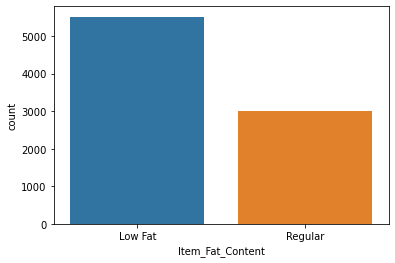

In [21]:
# Distribution Item Fat Content

print(bigdatamart_train['Item_Fat_Content'].value_counts(),'\n')

sns.countplot(x='Item_Fat_Content',data=bigdatamart_train)

Low Fat food has high number count as compared to stuff containing Regular Fat.

In [24]:
# Distribution Item Type

print(bigdatamart_train['Item_Type'].value_counts())

Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 [Text(0, 0, 'Dairy'),
  Text(1, 0, 'Soft Drinks'),
  Text(2, 0, 'Meat'),
  Text(3, 0, 'Fruits and Vegetables'),
  Text(4, 0, 'Household'),
  Text(5, 0, 'Baking Goods'),
  Text(6, 0, 'Snack Foods'),
  Text(7, 0, 'Frozen Foods'),
  Text(8, 0, 'Breakfast'),
  Text(9, 0, 'Health and Hygiene'),
  Text(10, 0, 'Hard Drinks'),
  Text(11, 0, 'Canned'),
  Text(12, 0, 'Breads'),
  Text(13, 0, 'Starchy Foods'),
  Text(14, 0, 'Others'),
  Text(15, 0, 'Seafood')])

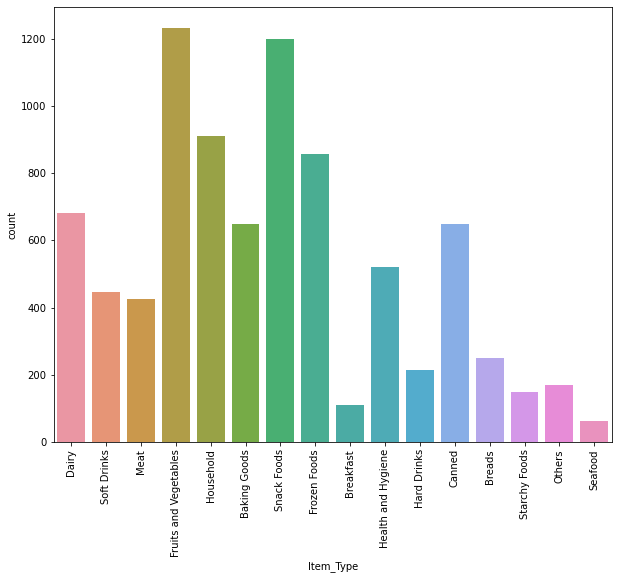

In [26]:
plt.figure(figsize=(10,8))
sns.countplot(x='Item_Type',data=bigdatamart_train)
plt.xticks(rotation=90)

Medium    5203
Small     2388
High       932
Name: Outlet_Size, dtype: int64 



<AxesSubplot:xlabel='Outlet_Size', ylabel='count'>

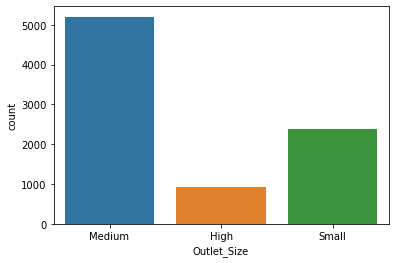

In [28]:
# Distribution Outlet Size

print(bigdatamart_train['Outlet_Size'].value_counts(),'\n')

sns.countplot(x='Outlet_Size',data=bigdatamart_train)

Presence of Mid sized Outlets surpass Small and Big outlets.

Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Outlet_Location_Type, dtype: int64 



<AxesSubplot:xlabel='Outlet_Location_Type', ylabel='count'>

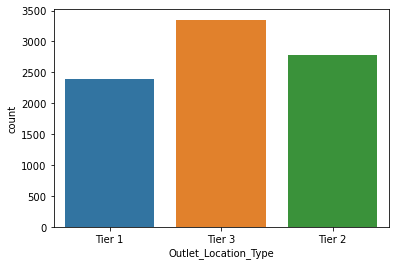

In [29]:
# Distribution Outlet Location Type

print(bigdatamart_train['Outlet_Location_Type'].value_counts(),'\n')

sns.countplot(x='Outlet_Location_Type',data=bigdatamart_train)

More numbers of outlets are seen in the Tier3 locations.

Supermarket Type1    5577
Grocery Store        1083
Supermarket Type3     935
Supermarket Type2     928
Name: Outlet_Type, dtype: int64 



(array([0, 1, 2, 3]),
 [Text(0, 0, 'Supermarket Type1'),
  Text(1, 0, 'Supermarket Type2'),
  Text(2, 0, 'Grocery Store'),
  Text(3, 0, 'Supermarket Type3')])

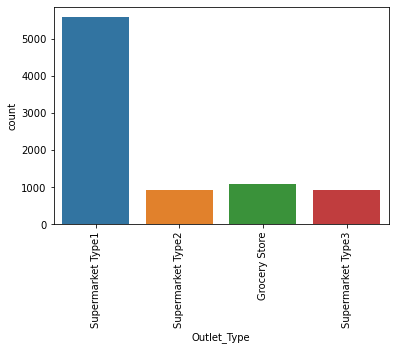

In [31]:
# Distribution Outlet Type

print(bigdatamart_train['Outlet_Type'].value_counts(),'\n')

sns.countplot(x='Outlet_Type',data=bigdatamart_train)
plt.xticks(rotation=90)

Count of Supermarket Type 1 is highest. Type2, Type3 and Grocery store has a large difference in numbers.

In [40]:
col=['Item_Fat_Content','Item_Type','Outlet_Size','Outlet_Location_Type','Outlet_Type']


# Bivariate analysis of Categorical columns

Checking contribution of various factors towards Sales and Revenue Generation

Text(0.5, 1.0, 'Item Fat Content vs Sales')

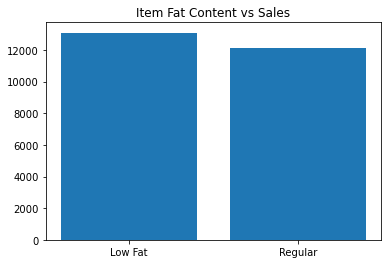

In [52]:
# Item Fat content with Sales

plt.bar('Item_Fat_Content','Item_Outlet_Sales',data=bigdatamart_train)
plt.title('Item Fat Content vs Sales')

Here we observe that the Low Fat food has high sales as compared to food containing Regular Fat

Text(0.5, 1.0, 'Item Type vs Sales')

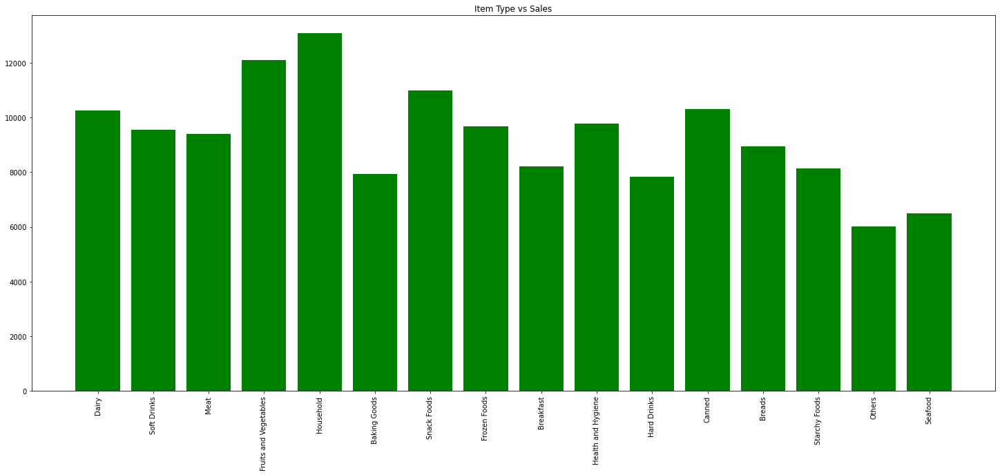

In [53]:
# Item Type content with Sales

plt.figure(figsize=(25,10))
plt.bar('Item_Type','Item_Outlet_Sales',data=bigdatamart_train,color='g')
plt.xticks(rotation=90)
plt.title('Item Type vs Sales')


Visualization shows that households item were sold the most followed by Fruits and Vegetables.

<BarContainer object of 8523 artists>

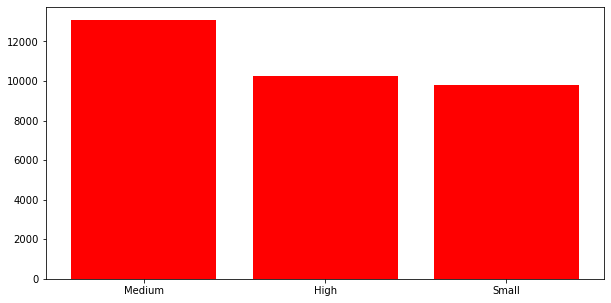

In [66]:
plt.figure(figsize=(10,5))
plt.bar('Outlet_Size','Item_Outlet_Sales',data=bigdatamart_train,color='r')

Medium Sized outlets performs better in terms of saling products. Small and High outlets don't have much difference in sales but has a significant difference from Medium sized outlets.

<BarContainer object of 8523 artists>

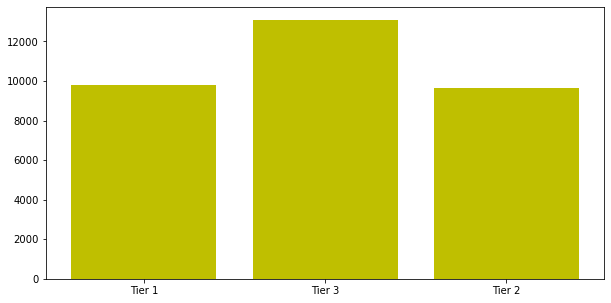

In [67]:
plt.figure(figsize=(10,5))
plt.bar('Outlet_Location_Type','Item_Outlet_Sales',data=bigdatamart_train,color='y')

Also Outlets in Tier3 cities have high sales figure

<BarContainer object of 8523 artists>

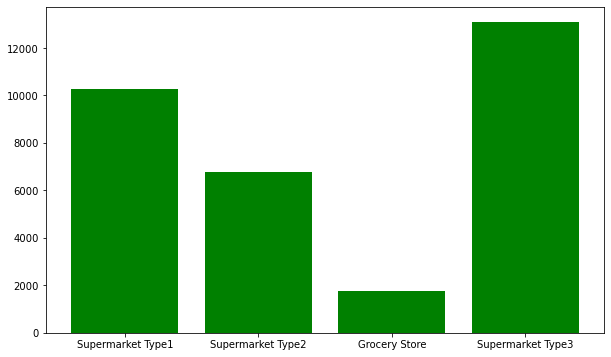

In [61]:
plt.figure(figsize=(10,6))
plt.bar('Outlet_Type','Item_Outlet_Sales',data=bigdatamart_train,color='g')

Outlets identified as Supermarket Type3 has high sales as compared to other type of outlet.Although the number count of Type1 is high but it isn't contributing much towards the sales figures.

# Analysing Columns with Continuous Values

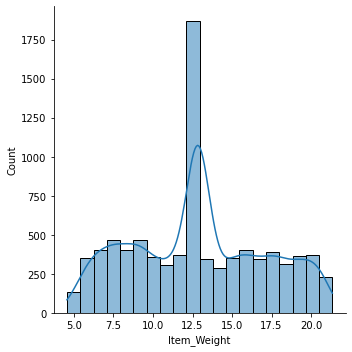

In [70]:
sns.displot(bigdatamart_train['Item_Weight'],kde=True,bins=20)

Item weight is distributed from 5 to 25. Items having weight around 12.5 has high number.

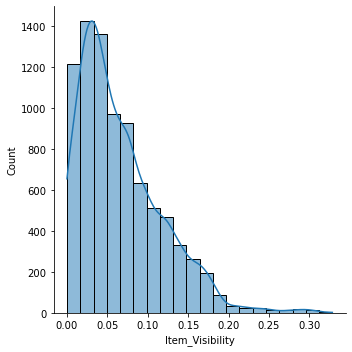

In [71]:
sns.displot(bigdatamart_train['Item_Visibility'],kde=True,bins=20,)

Above distribution shows that large number of items have visibilty between 0.02 to 0.05. A large number of items has 0 visibility in the store.

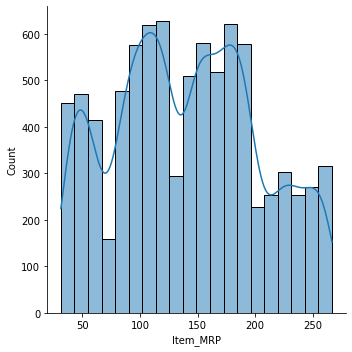

In [72]:
sns.displot(bigdatamart_train['Item_MRP'],kde=True,bins=20)

In [87]:
bigdatamart_train['Item_MRP'].max()

266.8884

MRP has a nominal distribution where majority of items are in the price range of 80-190. Highest price of an item is 266.88.

<BarContainer object of 8523 artists>

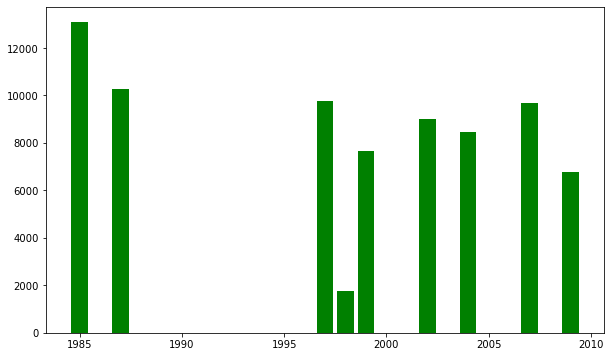

In [73]:
# Analysing impact of Establishment Year on Salesb

plt.figure(figsize=(10,6))
plt.bar('Outlet_Establishment_Year','Item_Outlet_Sales',data=bigdatamart_train,color='g')

We see older outlets which are functional for a longer time has high sales figures. This can be because of the known presence and customer satisfactory level.

# Correlation Matrix

In [76]:
bigdatamart_train_cor=bigdatamart_train.corr()
bigdatamart_train_cor

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
Item_Weight,1.000000,-0.012049,0.024756,-0.008301,0.011550
Item_Visibility,-0.012049,1.000000,-0.001315,-0.074834,-0.128625
Item_MRP,0.024756,-0.001315,1.000000,0.005020,0.567574
Outlet_Establishment_Year,-0.008301,-0.074834,0.005020,1.000000,-0.049135
Item_Outlet_Sales,0.011550,-0.128625,0.567574,-0.049135,1.000000


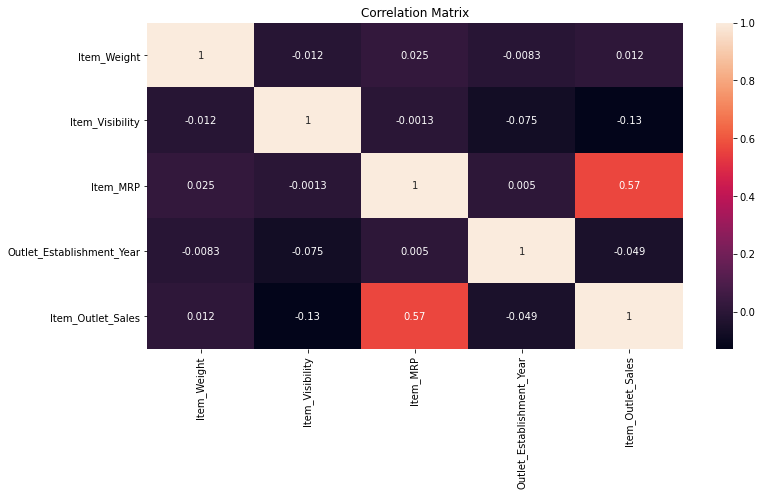

In [77]:
plt.figure(figsize=(12,6))
sns.heatmap(bigdatamart_train_cor,annot=True)
plt.title('Correlation Matrix')
plt.show()

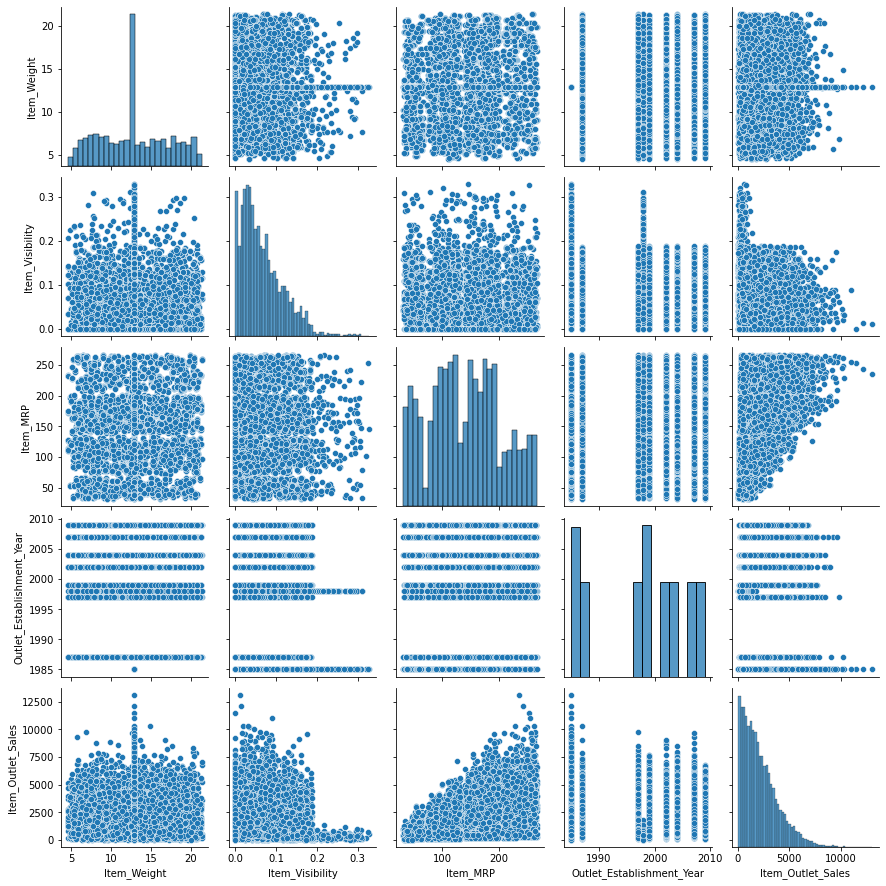

In [86]:
sns.pairplot(bigdatamart_train)

We observe a positive correlation between Item MRP and Sales.

We see a negative correlation between Item Visibility and Sales. As the max no of items have very less visibility and less visibility may results in decrease in sales. This negative correlation certainly reflect the same.

# Identifying Outliers

<AxesSubplot:xlabel='Item_MRP'>

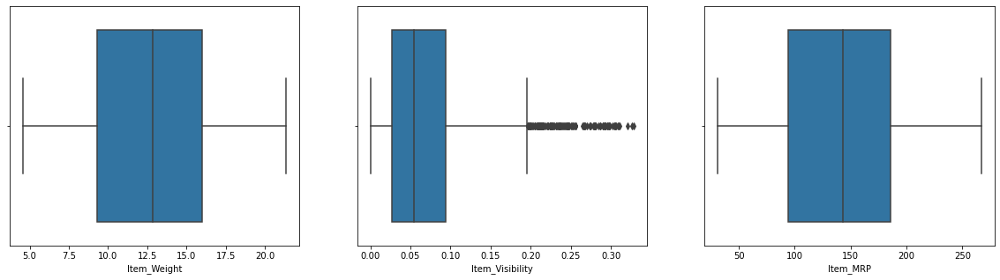

In [89]:
fig, ax =plt.subplots(1, 3, figsize=(20, 5))
sns.boxplot(bigdatamart_train['Item_Weight'], ax=ax[0])
sns.boxplot(bigdatamart_train['Item_Visibility'], ax=ax[1])
sns.boxplot(bigdatamart_train['Item_MRP'], ax=ax[2])

There are many outliers present in Item visibility column. We move ahead and remove the outliers.

# Removing Outliers

In [90]:
#Dataset shape before outlier removal

bigdatamart_train.shape

(8523, 12)

In [91]:
# Using IQR method

q3=bigdatamart_train['Item_Visibility'].quantile(0.75)
q1=bigdatamart_train['Item_Visibility'].quantile(0.25)
iqr=q3-q1
ub=q3+1.5*iqr
lb=q1-1.5*iqr
bigdatamart_train=bigdatamart_train[~((bigdatamart_train['Item_Visibility'] < lb) | (bigdatamart_train['Item_Visibility'] > ub))]

In [92]:
#Dataset shape after outlier removal

bigdatamart_train.shape

(8379, 12)

# Loss Percentage

In [93]:
loss=(8523-8379)/8523*100
print(loss)

1.689545934530095


We observe 1.65% data loss only.

# Checking Skewness

In [94]:
bigdatamart_train.skew()

Item_Weight                  0.089860
Item_Visibility              0.738153
Item_MRP                     0.129015
Outlet_Establishment_Year   -0.414811
Item_Outlet_Sales            1.170947
dtype: float64

With threshold as -/+ 0.5 we observe skewness in item visibility column.We treat skewness for the column.

# Skewness Correction

In [95]:
from sklearn.preprocessing import power_transform
bigdatamart_train['Item_Visibility']=power_transform(bigdatamart_train['Item_Visibility'].values.reshape(-1,1))
bigdatamart_train.skew()

Item_Weight                  0.089860
Item_Visibility              0.111759
Item_MRP                     0.129015
Outlet_Establishment_Year   -0.414811
Item_Outlet_Sales            1.170947
dtype: float64

Skewness is reduced in the targeted column

# Encoding

In [96]:
# Using Ordinal Encoder for changing string values to numeric form
from sklearn.preprocessing import OrdinalEncoder

In [97]:
OE=OrdinalEncoder()
for i in bigdatamart_train.columns:
    if bigdatamart_train[i].dtypes=='object':
        bigdatamart_train[i]=OE.fit_transform(bigdatamart_train[i].values.reshape(-1,1))

In [98]:
bigdatamart_train

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,156.0,9.300000,0.0,-1.139877,4.0,249.8092,9.0,1999,1.0,0.0,1.0,3735.1380
1,8.0,5.920000,1.0,-1.030228,14.0,48.2692,3.0,2009,1.0,2.0,2.0,443.4228
2,662.0,17.500000,0.0,-1.115421,10.0,141.6180,9.0,1999,1.0,0.0,1.0,2097.2700
3,1121.0,19.200000,1.0,-1.732951,6.0,182.0950,0.0,1998,1.0,2.0,0.0,732.3800
4,1297.0,8.930000,0.0,-1.732951,9.0,53.8614,1.0,1987,0.0,2.0,1.0,994.7052
5,758.0,10.395000,1.0,-1.732951,0.0,51.4008,3.0,2009,1.0,2.0,2.0,556.6088
6,696.0,13.650000,1.0,-1.255328,13.0,57.6588,1.0,1987,0.0,2.0,1.0,343.5528
7,738.0,12.857645,0.0,1.344946,13.0,107.7622,5.0,1985,1.0,2.0,3.0,4022.7636
8,440.0,16.200000,1.0,-1.117918,5.0,96.9726,7.0,2002,1.0,1.0,1.0,1076.5986
9,990.0,19.200000,1.0,0.828383,5.0,187.8214,2.0,2007,1.0,1.0,1.0,4710.5350


values of object type columns have been changed to numerical values. Now we move ahead and split our dataset as input and target variable and perform scaling.

# Splitting Input and Target Data

In [99]:
x=bigdatamart_train.drop(['Item_Outlet_Sales'],axis=1)
y=bigdatamart_train['Item_Outlet_Sales']
print(x.head(),'\n')
print(y.head(),'\n')
print(x.shape)
print(y.shape)

   Item_Identifier  Item_Weight  Item_Fat_Content  Item_Visibility  Item_Type  \
0            156.0         9.30               0.0        -1.139877        4.0   
1              8.0         5.92               1.0        -1.030228       14.0   
2            662.0        17.50               0.0        -1.115421       10.0   
3           1121.0        19.20               1.0        -1.732951        6.0   
4           1297.0         8.93               0.0        -1.732951        9.0   

   Item_MRP  Outlet_Identifier  Outlet_Establishment_Year  Outlet_Size  \
0  249.8092                9.0                       1999          1.0   
1   48.2692                3.0                       2009          1.0   
2  141.6180                9.0                       1999          1.0   
3  182.0950                0.0                       1998          1.0   
4   53.8614                1.0                       1987          0.0   

   Outlet_Location_Type  Outlet_Type  
0                   0.0      

# Scaling

As the data in the columns is distributed in a wide range we need to scale our data for better training.

In [100]:
# Using Standard Scaler

from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [101]:
x_new=sc.fit_transform(x)
x=pd.DataFrame(x_new,columns=x.columns)
x

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,-1.387787,-0.840406,-0.736563,-1.139877,-0.768754,1.747925,1.496517,0.125905,-0.274315,-1.379820,-0.281779
1,-1.716762,-1.637247,1.357656,-1.030228,1.609722,-1.488702,-0.624537,1.323226,-0.274315,1.092966,0.988274
2,-0.263049,1.092758,-0.736563,-1.115421,0.658332,0.010431,1.496517,0.125905,-0.274315,-1.379820,-0.281779
3,0.757218,1.493536,1.357656,-1.732951,-0.293059,0.660470,-1.685064,0.006173,-0.274315,1.092966,-1.551833
4,1.148431,-0.927634,-0.736563,-1.732951,0.420484,-1.398894,-1.331555,-1.310880,-1.941090,1.092966,-0.281779
5,-0.049660,-0.582258,1.357656,-1.732951,-1.720144,-1.438410,-0.624537,1.323226,-0.274315,1.092966,0.988274
6,-0.187473,0.185114,1.357656,-1.255328,1.371874,-1.337910,-1.331555,-1.310880,-1.941090,1.092966,-0.281779
7,-0.094116,-0.001685,-0.736563,1.344946,1.371874,-0.533275,0.082481,-1.550344,-0.274315,1.092966,2.258327
8,-0.756511,0.786280,1.357656,-1.117918,-0.530906,-0.706551,0.789499,0.485102,-0.274315,-0.143427,-0.281779
9,0.466031,1.493536,1.357656,0.828383,-0.530906,0.752433,-0.978046,1.083762,-0.274315,-0.143427,-0.281779


# Creating Train Test Split and Importing Algorithms

In [116]:
# Importing Regression Algorithms
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso,Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

In [107]:
maxAccu=0
maxRs=0
for i in range(1,500):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    lr_pred=lr.predict(x_test)
    acc=r2_score(y_test,lr_pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRs=i
print('Best R2 Score is : ', maxAccu, ' when Random state is : ',maxRs)

Best R2 Score is :  0.5366185525353284  when Random state is :  427


In [108]:
# Setting Random state at 427

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=427)

# Checking Various Algorithms for highest R2 Score

In [109]:
# Defining Model List
model_list=[LinearRegression(),SVR(),DecisionTreeRegressor(),KNeighborsRegressor(),RandomForestRegressor()]

In [110]:
# Creating For loop to print Training and Test accuracy score
for m in model_list:
    model=m
    model.fit(x_train,y_train)
    model_pred_train=model.predict(x_train)
    model_pred=model.predict(x_test)
    print('Training Accuracy for the model ',m,' is: ',r2_score(y_train,model_pred_train)*100)
    print('Testing Accuracy for the model ',m,' is: ',r2_score(y_test,model_pred)*100)
    print('\n')
    

Training Accuracy for the model  LinearRegression()  is:  49.27725238520166
Testing Accuracy for the model  LinearRegression()  is:  53.66185525353284


Training Accuracy for the model  SVR()  is:  2.7317579513656765
Testing Accuracy for the model  SVR()  is:  4.032252510479795


Training Accuracy for the model  DecisionTreeRegressor()  is:  100.0
Testing Accuracy for the model  DecisionTreeRegressor()  is:  11.813181054911947


Training Accuracy for the model  KNeighborsRegressor()  is:  66.21678612283841
Testing Accuracy for the model  KNeighborsRegressor()  is:  51.69463337094846


Training Accuracy for the model  RandomForestRegressor()  is:  93.53164550669626
Testing Accuracy for the model  RandomForestRegressor()  is:  56.76427828279296




As we see we get bette performance with Linear Regression , KNeighbor Regressor and Random Forest Regressor. 

We further cross validate these models to check for overfitting or underfitting.

# Cross Validation

In [111]:
from sklearn.model_selection import cross_val_score

In [113]:
# Cross validating Linear Regression
lr=LinearRegression()
lr.fit(x_train,y_train)
lr_pred=lr.predict(x_test)
testing_accu=r2_score(y_test,lr_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(lr,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 50.330191555232204 and the accuracy for testing is 53.66185525353284 


At crossfold 3 the CV score of is 50.38462710662799 and the accuracy for testing is 53.66185525353284 


At crossfold 4 the CV score of is 50.21273423701847 and the accuracy for testing is 53.66185525353284 


At crossfold 5 the CV score of is 50.3362354358925 and the accuracy for testing is 53.66185525353284 


At crossfold 6 the CV score of is 50.33104051279953 and the accuracy for testing is 53.66185525353284 


At crossfold 7 the CV score of is 50.39011073035472 and the accuracy for testing is 53.66185525353284 


At crossfold 8 the CV score of is 50.29861972623644 and the accuracy for testing is 53.66185525353284 


At crossfold 9 the CV score of is 50.329641886031894 and the accuracy for testing is 53.66185525353284 




In [114]:
# Cross validating KNeighbor Regressor
knn=KNeighborsRegressor()
knn.fit(x_train,y_train)
knn_pred=knn.predict(x_test)
testing_accu=r2_score(y_test,knn_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(knn,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 48.21694593721072 and the accuracy for testing is 51.69463337094846 


At crossfold 3 the CV score of is 50.18166696629402 and the accuracy for testing is 51.69463337094846 


At crossfold 4 the CV score of is 49.63261874550335 and the accuracy for testing is 51.69463337094846 


At crossfold 5 the CV score of is 49.770755281251084 and the accuracy for testing is 51.69463337094846 


At crossfold 6 the CV score of is 50.23739431735251 and the accuracy for testing is 51.69463337094846 


At crossfold 7 the CV score of is 50.42380562899809 and the accuracy for testing is 51.69463337094846 


At crossfold 8 the CV score of is 50.47654204400273 and the accuracy for testing is 51.69463337094846 


At crossfold 9 the CV score of is 49.99978706096717 and the accuracy for testing is 51.69463337094846 




# Ensemble Techniques

In [115]:
# Cross validating RandomForestRegressor
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)
rfr_pred=rfr.predict(x_test)
testing_accu=r2_score(y_test,rfr_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(rfr,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 53.967657388421344 and the accuracy for testing is 57.23210342232201 


At crossfold 3 the CV score of is 54.05277241045678 and the accuracy for testing is 57.23210342232201 


At crossfold 4 the CV score of is 54.18076631769014 and the accuracy for testing is 57.23210342232201 


At crossfold 5 the CV score of is 54.23339903998572 and the accuracy for testing is 57.23210342232201 


At crossfold 6 the CV score of is 54.754965637636765 and the accuracy for testing is 57.23210342232201 


At crossfold 7 the CV score of is 54.50249184342402 and the accuracy for testing is 57.23210342232201 


At crossfold 8 the CV score of is 54.67730038802719 and the accuracy for testing is 57.23210342232201 


At crossfold 9 the CV score of is 54.433144486178534 and the accuracy for testing is 57.23210342232201 




In [119]:
# Cross validating GradientBoostingRegressor

from sklearn.ensemble import GradientBoostingRegressor
reg = GradientBoostingRegressor()
reg.fit(x_train, y_train)
reg_pred=reg.predict(x_test)
testing_accu=r2_score(y_test,reg_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(reg,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 58.034347352257186 and the accuracy for testing is 61.759262188256116 


At crossfold 3 the CV score of is 58.47938692701861 and the accuracy for testing is 61.759262188256116 


At crossfold 4 the CV score of is 58.2999356087058 and the accuracy for testing is 61.759262188256116 


At crossfold 5 the CV score of is 58.423825545971816 and the accuracy for testing is 61.759262188256116 


At crossfold 6 the CV score of is 58.753266034825124 and the accuracy for testing is 61.759262188256116 


At crossfold 7 the CV score of is 58.72322335776688 and the accuracy for testing is 61.759262188256116 


At crossfold 8 the CV score of is 58.67964778005028 and the accuracy for testing is 61.759262188256116 


At crossfold 9 the CV score of is 58.687792078076285 and the accuracy for testing is 61.759262188256116 




# Using Regularization

In [117]:
# Cross validating Lasso
ls=Lasso()
ls.fit(x_train,y_train)
ls_pred=ls.predict(x_test)
testing_accu=r2_score(y_test,ls_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(ls,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 50.337104358816596 and the accuracy for testing is 53.65536352688798 


At crossfold 3 the CV score of is 50.38827893486633 and the accuracy for testing is 53.65536352688798 


At crossfold 4 the CV score of is 50.22074617923469 and the accuracy for testing is 53.65536352688798 


At crossfold 5 the CV score of is 50.34276098131395 and the accuracy for testing is 53.65536352688798 


At crossfold 6 the CV score of is 50.33772539261632 and the accuracy for testing is 53.65536352688798 


At crossfold 7 the CV score of is 50.394502572728314 and the accuracy for testing is 53.65536352688798 


At crossfold 8 the CV score of is 50.30615812929942 and the accuracy for testing is 53.65536352688798 


At crossfold 9 the CV score of is 50.33455770880012 and the accuracy for testing is 53.65536352688798 




# Algorithm Observation

With above algortihms we observe

1. Among Linear Regression, KNeighbors, Random Forest, Lasso and Gradient Boost we get highest R2 score with Gradient boost at 61%

2. After cross validating it seems that although Gradient boost has higher R2 score but it has overfitting or underfitting as the CV score suggest.

3. With KNN although accuracy is low at 51% but it has least difference between R2 score and CV score which is 1.20.

We move ahead with KNN and hyper tune the model to check for accuracy improvement.

# Hyper Tuning

In [161]:
# Importing Gridsearch CV

from sklearn.model_selection import GridSearchCV

In [162]:
# defining parameters


gr_param={'n_neighbors':range(2,15),'weights':['uniform', 'distance'],'algorithm':['auto', 'ball_tree', 'kd_tree','brute']}
gcv= GridSearchCV(estimator=knn,param_grid=gr_param,scoring='r2',cv=5)

In [163]:
# Getting Best Parameters

gcv.fit(x_train,y_train)
gcv.best_params_


{'algorithm': 'auto', 'n_neighbors': 14, 'weights': 'distance'}

In [164]:
# Training the model with given parameters


knn=KNeighborsRegressor(algorithm='auto',n_neighbors=14,weights='distance')
knn.fit(x_train,y_train)
knn_pred=knn.predict(x_test)
testing_accu=r2_score(y_test,knn_pred)*100

cv_score=cross_val_score(knn,x,y,cv=k)
cv_mean=cv_score.mean()*100
print(f'The CV score of the model is {cv_mean} and the R2 Score for testing is {testing_accu} ')
print('\n')

print('Mean Squared Error of the model is : ',mean_squared_error(y_test,knn_pred))
print('Mean Absolute Error of the model is : ',mean_absolute_error(y_test,knn_pred))
print('Root Mean Squared Error of the model is : ',np.sqrt(mean_squared_error(y_test,knn_pred)),'\n')

The CV score of the model is 54.38219943531612 and the R2 Score for testing is 57.219403069733744 


Mean Squared Error of the model is :  1196466.1800060766
Mean Absolute Error of the model is :  792.7758027445418
Root Mean Squared Error of the model is :  1093.8309650060546 



# Plotting the graph

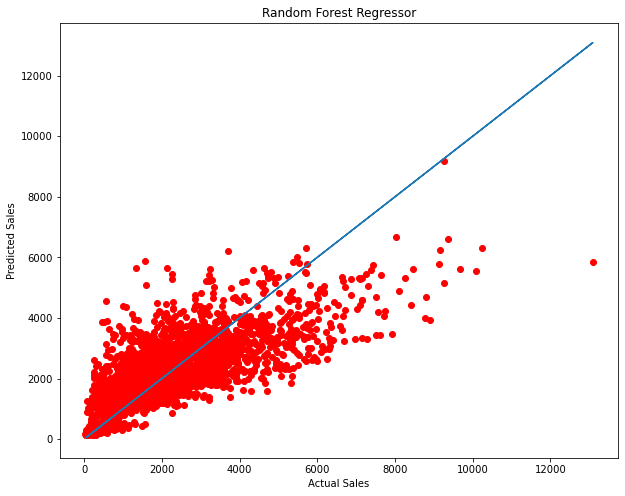

In [165]:
plt.figure(figsize=(10,8))
plt.scatter(x=y_test,y=knn_pred,color='r')
plt.plot(y_test,y_test)
plt.xlabel('Actual Sales')
plt.ylabel('Predicted Sales')
plt.title("Random Forest Regressor")
plt.show()

As we see majority of data is near the test line. There is some values which are far away from the line.

# Saving the Model

In [166]:
import pickle
filename='bigmartdata_knn.pkl'
pickle.dump(knn,open(filename,'wb'))

# Working With Test Dataset

In [120]:
bigdatamart_test=pd.read_csv('bigdatamart_test.csv')

In [122]:
bigdatamart_test.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,FDW58,20.750,Low Fat,0.007565,Snack Foods,107.8622,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,FDW14,8.300,reg,0.038428,Dairy,87.3198,OUT017,2007,NaN,Tier 2,Supermarket Type1
2,NCN55,14.600,Low Fat,0.099575,Others,241.7538,OUT010,1998,NaN,Tier 3,Grocery Store
3,FDQ58,7.315,Low Fat,0.015388,Snack Foods,155.0340,OUT017,2007,NaN,Tier 2,Supermarket Type1
4,FDY38,NaN,Regular,0.118599,Dairy,234.2300,OUT027,1985,Medium,Tier 3,Supermarket Type3


In [123]:
bigdatamart_test.tail()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
5676,FDB58,10.5,Regular,0.013496,Snack Foods,141.3154,OUT046,1997,Small,Tier 1,Supermarket Type1
5677,FDD47,7.6,Regular,0.142991,Starchy Foods,169.1448,OUT018,2009,Medium,Tier 3,Supermarket Type2
5678,NCO17,10.0,Low Fat,0.073529,Health and Hygiene,118.7440,OUT045,2002,NaN,Tier 2,Supermarket Type1
5679,FDJ26,15.3,Regular,0.000000,Canned,214.6218,OUT017,2007,NaN,Tier 2,Supermarket Type1
5680,FDU37,9.5,Regular,0.104720,Canned,79.7960,OUT045,2002,NaN,Tier 2,Supermarket Type1


In [124]:
bigdatamart_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5681 entries, 0 to 5680
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            5681 non-null   object 
 1   Item_Weight                4705 non-null   float64
 2   Item_Fat_Content           5681 non-null   object 
 3   Item_Visibility            5681 non-null   float64
 4   Item_Type                  5681 non-null   object 
 5   Item_MRP                   5681 non-null   float64
 6   Outlet_Identifier          5681 non-null   object 
 7   Outlet_Establishment_Year  5681 non-null   int64  
 8   Outlet_Size                4075 non-null   object 
 9   Outlet_Location_Type       5681 non-null   object 
 10  Outlet_Type                5681 non-null   object 
dtypes: float64(3), int64(1), object(7)
memory usage: 488.3+ KB


In [126]:
bigdatamart_test.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
dtype: object

# Checking Null Values

In [128]:
bigdatamart_test.isnull().sum()

Item_Identifier                 0
Item_Weight                   976
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  1606
Outlet_Location_Type            0
Outlet_Type                     0
dtype: int64

We observe there are null values present in Item Weight and Outlet Size.

# Treating missing values

In [131]:
# Replacing null values in the Item Weight Column with the mean of the column

bigdatamart_test['Item_Weight']=bigdatamart_test['Item_Weight'].fillna(bigdatamart_test['Item_Weight'].mean())

In [132]:
bigdatamart_test['Outlet_Size'].unique()

array(['Medium', nan, 'Small', 'High'], dtype=object)

In [133]:
bigdatamart_test['Outlet_Size'].value_counts()

Medium    1862
Small     1592
High       621
Name: Outlet_Size, dtype: int64

In [134]:
# Replacing missing values in Outlet Size with most frequently occuring value.
bigdatamart_test['Outlet_Size']=bigdatamart_test['Outlet_Size'].fillna('Medium')

In [135]:
# Verifying Null Values

bigdatamart_test.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
dtype: int64

No Null Values Present

In [136]:
# Checking columns

bigdatamart_test.columns

Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_Type', 'Item_MRP', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type'],
      dtype='object')

# Analysing Continuous Columns

In [137]:
bigdatamart_test.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year
count,5681.000000,5681.000000,5681.000000,5681.000000
mean,12.695633,0.065684,141.023273,1997.828903
std,4.245189,0.051252,61.809091,8.372256
min,4.555000,0.000000,31.990000,1985.000000
25%,9.195000,0.027047,94.412000,1987.000000
50%,12.695633,0.054154,141.415400,1999.000000
75%,15.850000,0.093463,186.026600,2004.000000
max,21.350000,0.323637,266.588400,2009.000000


# Checking Categorical columns

In [138]:
bigdatamart_test['Item_Fat_Content'].unique()

array(['Low Fat', 'reg', 'Regular', 'LF', 'low fat'], dtype=object)

It seems there are some typing errors in the categories.

'Low Fat' is spelled as 'low fat' or 'LF' and 'Regular' is spelled as 'reg'
We nee to correct them.

In [139]:
bigdatamart_test['Item_Fat_Content'] = bigdatamart_test['Item_Fat_Content'].replace(['low fat','LF','reg'], ['Low Fat','Low Fat','Regular'])

In [140]:
bigdatamart_test['Item_Fat_Content'].unique()

array(['Low Fat', 'Regular'], dtype=object)

Now there are only 2 categories.

# Visualising and Analysing Categorical columns

Low Fat    3668
Regular    2013
Name: Item_Fat_Content, dtype: int64 



<AxesSubplot:xlabel='Item_Fat_Content', ylabel='count'>

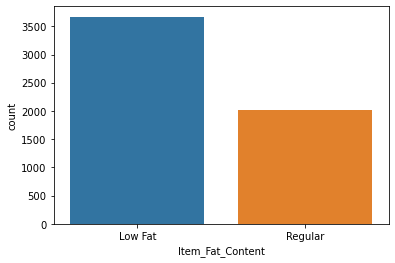

In [141]:
# Distribution Item Fat Content

print(bigdatamart_test['Item_Fat_Content'].value_counts(),'\n')

sns.countplot(x='Item_Fat_Content',data=bigdatamart_test)

In [142]:
# Distribution Item Type

print(bigdatamart_test['Item_Type'].value_counts())

Snack Foods              789
Fruits and Vegetables    781
Household                638
Frozen Foods             570
Dairy                    454
Baking Goods             438
Canned                   435
Health and Hygiene       338
Meat                     311
Soft Drinks              281
Breads                   165
Hard Drinks              148
Starchy Foods            121
Others                   111
Breakfast                 76
Seafood                   25
Name: Item_Type, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 [Text(0, 0, 'Snack Foods'),
  Text(1, 0, 'Dairy'),
  Text(2, 0, 'Others'),
  Text(3, 0, 'Fruits and Vegetables'),
  Text(4, 0, 'Baking Goods'),
  Text(5, 0, 'Health and Hygiene'),
  Text(6, 0, 'Breads'),
  Text(7, 0, 'Hard Drinks'),
  Text(8, 0, 'Seafood'),
  Text(9, 0, 'Soft Drinks'),
  Text(10, 0, 'Household'),
  Text(11, 0, 'Frozen Foods'),
  Text(12, 0, 'Meat'),
  Text(13, 0, 'Canned'),
  Text(14, 0, 'Starchy Foods'),
  Text(15, 0, 'Breakfast')])

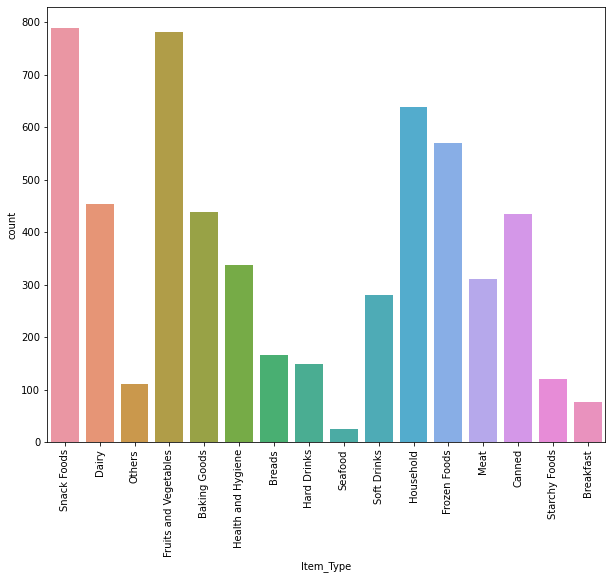

In [143]:
plt.figure(figsize=(10,8))
sns.countplot(x='Item_Type',data=bigdatamart_test)
plt.xticks(rotation=90)

Medium    3468
Small     1592
High       621
Name: Outlet_Size, dtype: int64 



<AxesSubplot:xlabel='Outlet_Size', ylabel='count'>

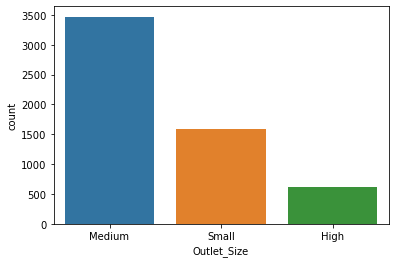

In [144]:
# Distribution Outlet Size

print(bigdatamart_test['Outlet_Size'].value_counts(),'\n')

sns.countplot(x='Outlet_Size',data=bigdatamart_test)

Tier 3    2233
Tier 2    1856
Tier 1    1592
Name: Outlet_Location_Type, dtype: int64 



<AxesSubplot:xlabel='Outlet_Location_Type', ylabel='count'>

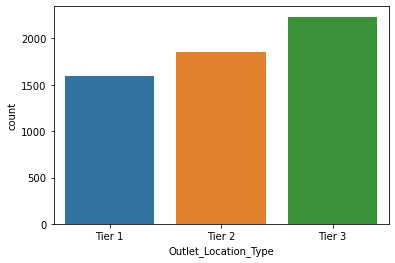

In [145]:
# Distribution Outlet Location Type

print(bigdatamart_test['Outlet_Location_Type'].value_counts(),'\n')

sns.countplot(x='Outlet_Location_Type',data=bigdatamart_test)

Supermarket Type1    3717
Grocery Store         722
Supermarket Type3     624
Supermarket Type2     618
Name: Outlet_Type, dtype: int64 



(array([0, 1, 2, 3]),
 [Text(0, 0, 'Supermarket Type1'),
  Text(1, 0, 'Grocery Store'),
  Text(2, 0, 'Supermarket Type3'),
  Text(3, 0, 'Supermarket Type2')])

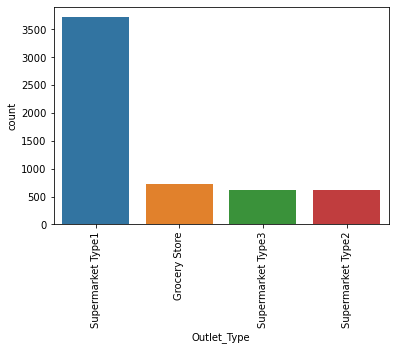

In [146]:
# Distribution Outlet Type

print(bigdatamart_test['Outlet_Type'].value_counts(),'\n')

sns.countplot(x='Outlet_Type',data=bigdatamart_test)
plt.xticks(rotation=90)

# Analysing Columns with Continuous Values

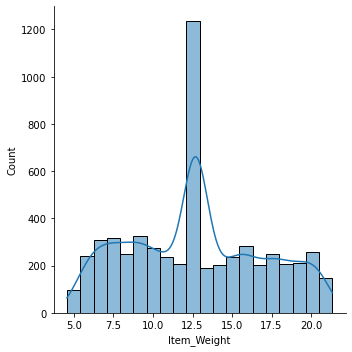

In [147]:
sns.displot(bigdatamart_test['Item_Weight'],kde=True,bins=20)

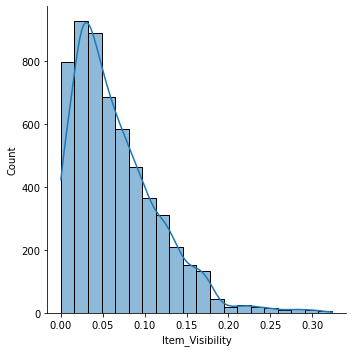

In [148]:
sns.displot(bigdatamart_test['Item_Visibility'],kde=True,bins=20,)

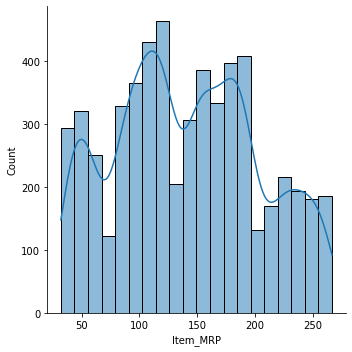

In [149]:
sns.displot(bigdatamart_test['Item_MRP'],kde=True,bins=20)

# Identifying Outliers

<AxesSubplot:xlabel='Item_MRP'>

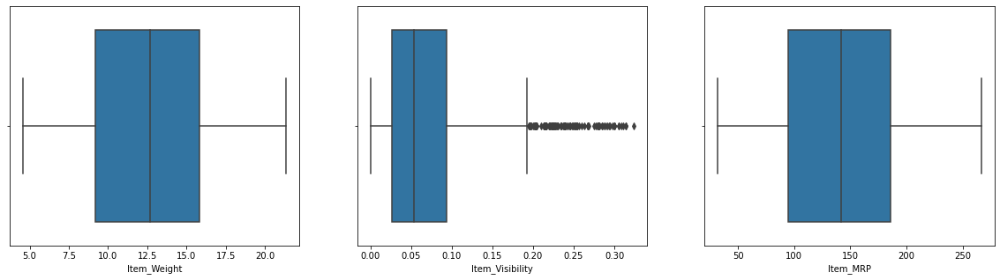

In [150]:
fig, ax =plt.subplots(1, 3, figsize=(20, 5))
sns.boxplot(bigdatamart_test['Item_Weight'], ax=ax[0])
sns.boxplot(bigdatamart_test['Item_Visibility'], ax=ax[1])
sns.boxplot(bigdatamart_test['Item_MRP'], ax=ax[2])

There are many outliers present in Item visibility column. We move ahead and remove the outliers.

# Removing Outliers

In [151]:
#Dataset shape before outlier removal

bigdatamart_test.shape

(5681, 11)

In [152]:
# Using IQR method

q3=bigdatamart_test['Item_Visibility'].quantile(0.75)
q1=bigdatamart_test['Item_Visibility'].quantile(0.25)
iqr=q3-q1
ub=q3+1.5*iqr
lb=q1-1.5*iqr
bigdatamart_test=bigdatamart_test[~((bigdatamart_test['Item_Visibility'] < lb) | (bigdatamart_test['Item_Visibility'] > ub))]

In [153]:
#Dataset shape after outlier removal

bigdatamart_test.shape

(5568, 11)

# Loss Percentage

In [154]:
loss=(5681-5568)/5681*100
print(loss)

1.9890864284456962


We observe 1.98% data loss only.

# Checking Skewness

In [155]:
bigdatamart_test.skew()

Item_Weight                  0.141629
Item_Visibility              0.721386
Item_MRP                     0.131805
Outlet_Establishment_Year   -0.415829
dtype: float64

With threshold as -/+ 0.5 we observe skewness in item visibility column.We treat skewness for the column.

# Skewness Correction

In [156]:
from sklearn.preprocessing import power_transform
bigdatamart_test['Item_Visibility']=power_transform(bigdatamart_test['Item_Visibility'].values.reshape(-1,1))
bigdatamart_test.skew()

Item_Weight                  0.141629
Item_Visibility              0.102102
Item_MRP                     0.131805
Outlet_Establishment_Year   -0.415829
dtype: float64

# Encoding

In [157]:
# Using Ordinal Encoder for changing string values to numeric form
from sklearn.preprocessing import OrdinalEncoder

In [158]:
OE=OrdinalEncoder()
for i in bigdatamart_test.columns:
    if bigdatamart_test[i].dtypes=='object':
        bigdatamart_test[i]=OE.fit_transform(bigdatamart_test[i].values.reshape(-1,1))

In [159]:
bigdatamart_test

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,1101.0,20.750000,0.0,-1.450751,13.0,107.8622,9.0,1999,1.0,0.0,1.0
1,1065.0,8.300000,1.0,-0.435945,4.0,87.3198,2.0,2007,1.0,1.0,1.0
2,1404.0,14.600000,0.0,0.947320,11.0,241.7538,0.0,1998,1.0,2.0,0.0
3,808.0,7.315000,0.0,-1.167746,13.0,155.0340,2.0,2007,1.0,1.0,1.0
4,1182.0,12.695633,1.0,1.256617,4.0,234.2300,5.0,1985,1.0,2.0,3.0
5,461.0,9.800000,1.0,0.222839,6.0,117.1492,8.0,1997,2.0,0.0,1.0
6,604.0,19.350000,1.0,0.629265,0.0,50.1034,3.0,2009,1.0,2.0,2.0
7,266.0,12.695633,0.0,-1.153986,0.0,81.0592,5.0,1985,1.0,2.0,3.0
8,668.0,6.305000,1.0,1.327175,13.0,95.7436,7.0,2002,1.0,1.0,1.0
9,170.0,5.985000,0.0,-1.521128,0.0,186.8924,2.0,2007,1.0,1.0,1.0


values of object type columns have been changed to numerical values. 

Now as we have performed data analysing and data correction on the Test Dataset we can move ahead and pass the dataset in our trained model for the prediction.

# Loading Model

In [167]:
load_model=pickle.load(open('bigmartdata_knn.pkl','rb'))

In [168]:
load_model

KNeighborsRegressor(n_neighbors=14, weights='distance')

In [170]:
predictions=load_model.predict(bigdatamart_test)

In [171]:
predictions

array([3584.67923807, 3549.86488346, 3727.54715549, ..., 3549.86655802,
       4067.29140632, 3549.86460796])